In [1]:
# Install Essential Libraries
!pip install ultralytics --no-deps

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.9 MB/s eta 0:00:00a 0:00:01


# Import Ultralytics

In [2]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.217 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6515.5/8062.4 GB disk)


In [3]:
import sys, importlib, inspect
import numpy as np, scipy, matplotlib
try:
    import seaborn as sns
    print("seaborn:", sns.__version__, "path:", sns.__file__)
    import seaborn.utils as su
    print("seaborn.utils members:", [m for m in dir(su) if m.startswith("_version")])
except Exception as e:
    print("ERROR:", e)

print("python:", sys.version.splitlines()[0])
print("numpy:", np.__version__)
print("scipy:", scipy.__version__)
print("matplotlib:", matplotlib.__version__)


seaborn: 0.12.2 path: /usr/local/lib/python3.11/dist-packages/seaborn/__init__.py
seaborn.utils members: []
python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
numpy: 1.26.4
scipy: 1.15.3
matplotlib: 3.7.2


In [4]:
import os
import random
import pandas as pd
import numpy as np

from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video

import matplotlib.pyplot as plt
import seaborn as sns
#sns.set(style='darkgrid')
import pathlib
from glob import glob
from tqdm.notebook import trange, tqdm


import warnings
warnings.filterwarnings('ignore')

# Show some train images

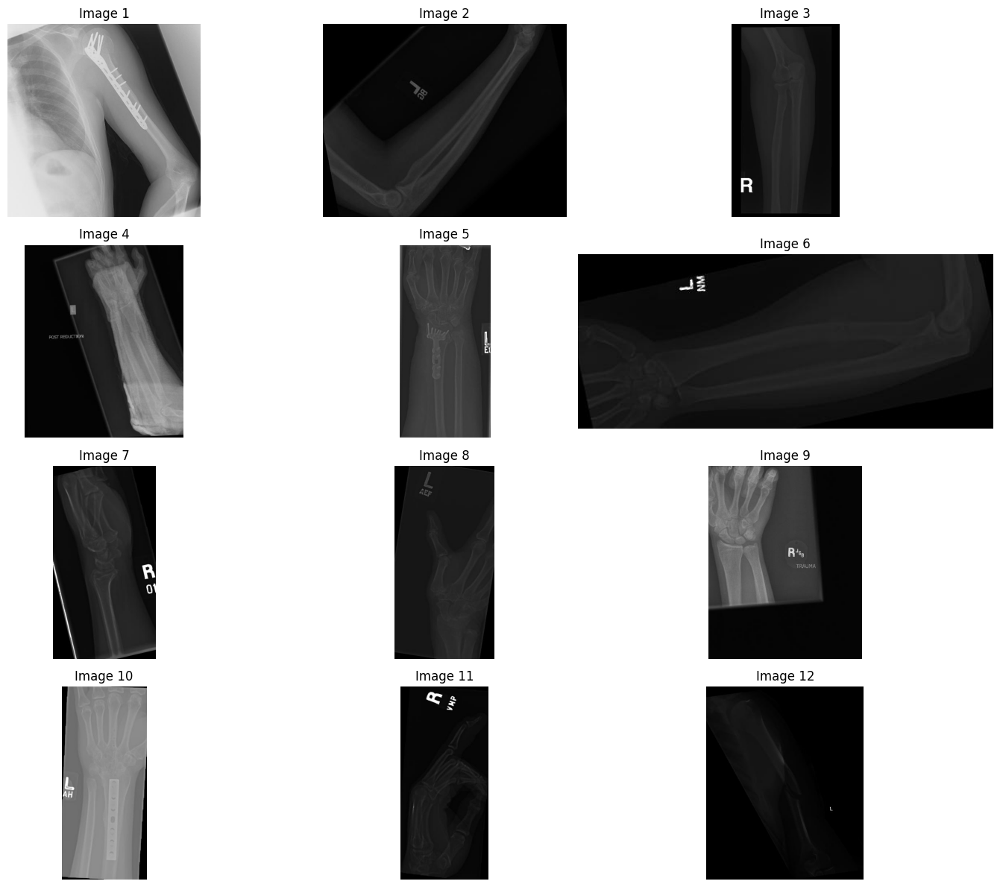

In [5]:
Image_dir = '/kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/train/images'

num_samples = 12
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(4, 3, figsize=(15, 12))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

# YOLO11s model loaded

In [6]:
# Use a pretrained YOLOv8n model
# model = YOLO("yolov8n.pt") 
model = YOLO('yolo11s.pt')
# model = YOLO('yolov8m.pt')

# Image predict use pre-trained yolo model

In [10]:
image = "/kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/train/images/image1_1014_png.rf.3c994368f0740a7339e332685995b34f.jpg"

im = cv2.imread(image)
if im is None:
    print("Failed to load image")
else:
    print("Image shape:", im.shape)

Image shape: (512, 295, 3)


In [11]:
result = model.predict(source=image, imgsz=512)


image 1/1 /kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/train/images/image1_1014_png.rf.3c994368f0740a7339e332685995b34f.jpg: 512x320 1 person, 1 tie, 58.0ms
Speed: 1.2ms preprocess, 58.0ms inference, 3.4ms postprocess per image at shape (1, 3, 512, 320)


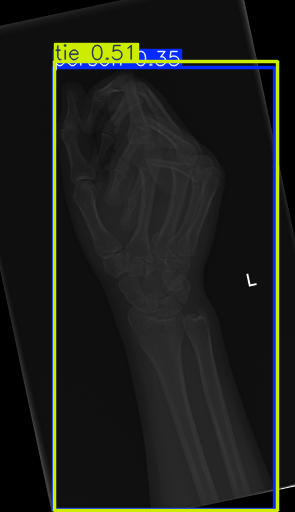

In [12]:
#show results
plot = result[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

# Model training

In [13]:
results = model.train(
    data='/kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/data.yaml',
    epochs=50,
    imgsz=640,  # Increase resolution for small objects
    patience=5,
    batch=16,  # 16 instead of 32, depending on GPU memory
    optimizer='auto',  # Use SGD for better generalization # auto
    lr0=0.001,  # 0.0001 is a bit low, 0.001 might allow faster learning
    lrf=0.01,  # To reduce the final learning rate
    seed=0,
    dropout=0.2,
    #iou=0.6,  # IoU threshold for NMS
    #hsv_h=0.015,  # Color augmentation 
    # hsv_s=0.7,
    # hsv_v=0.4,
    plots=True
)

Ultralytics 8.3.217 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.2, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.6, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap

In [14]:
metrics = model.val()

Ultralytics 8.3.217 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,415,509 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 22.6±11.5 MB/s, size: 10.4 KB)
val: Scanning /kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/valid/labels... 348 images, 175 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 348/348 805.2it/s 0.4s0.0s
WARNING ⚠️ val: Cache directory /kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 22/22 4.9it/s 4.5s0.1s
                   all        348        204      0.302      0.261      0.227     0.0872
        elbow positive         28         29      0.232      0.207      0.183     0.0663
      fingers positive         41         48      0.187      0.104      0.107     0.0327
      forearm fract

# Save the trained model

In [15]:
# Save the trained model
model.save('yolov11_trained.pt')
print("Model trained and saved successfully!")

Model trained and saved successfully!


In [16]:
# Define the path to the directory
post_training_files_path ='/kaggle/working/runs/detect/train'
#post_training_files_path ='/kaggle/working/runs/detect/train'
# List the files in the directory
!ls {post_training_files_path}

args.yaml			 results.csv	      val_batch0_labels.jpg
BoxF1_curve.png			 results.png	      val_batch0_pred.jpg
BoxP_curve.png			 train_batch0.jpg     val_batch1_labels.jpg
BoxPR_curve.png			 train_batch1.jpg     val_batch1_pred.jpg
BoxR_curve.png			 train_batch2.jpg     val_batch2_labels.jpg
confusion_matrix_normalized.png  train_batch6810.jpg  val_batch2_pred.jpg
confusion_matrix.png		 train_batch6811.jpg  weights
labels.jpg			 train_batch6812.jpg


# After trained detect images

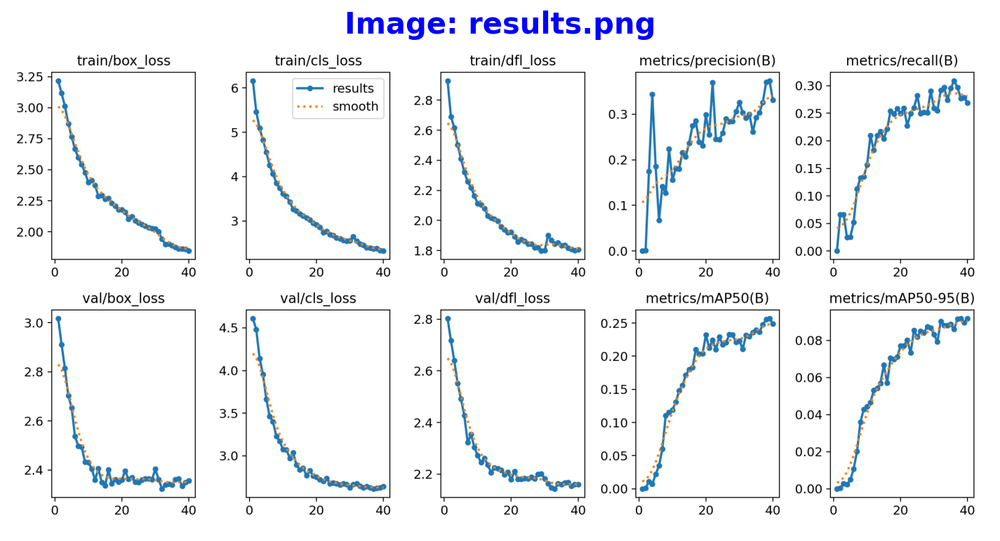

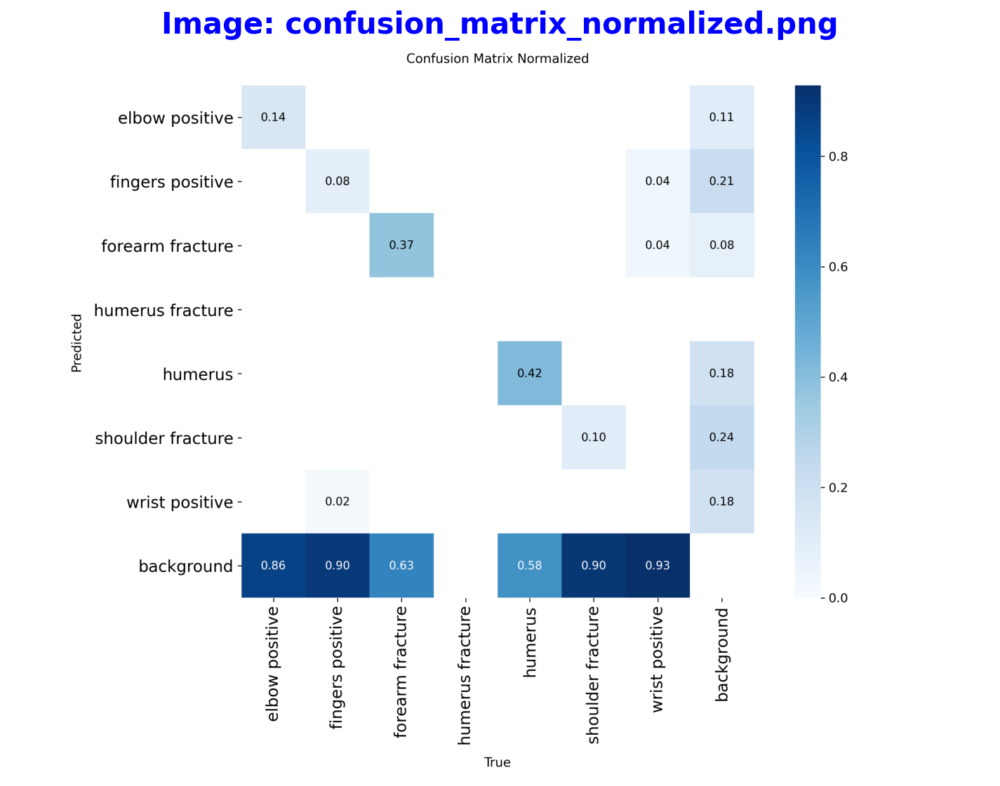

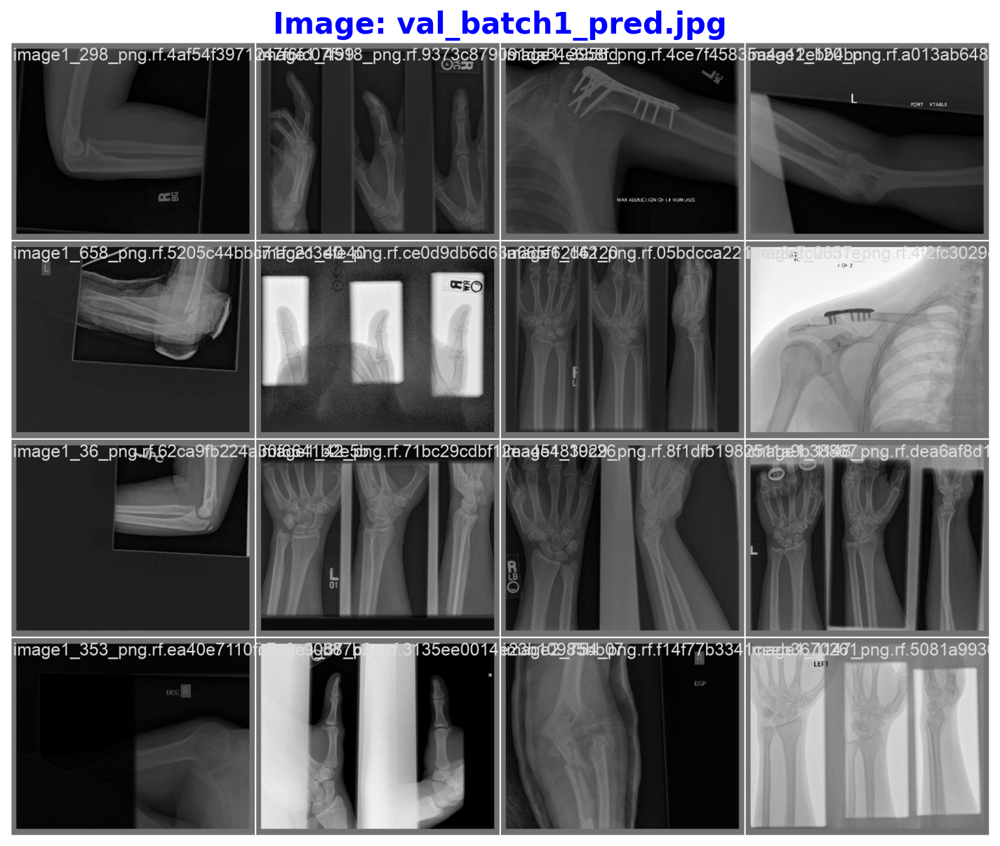

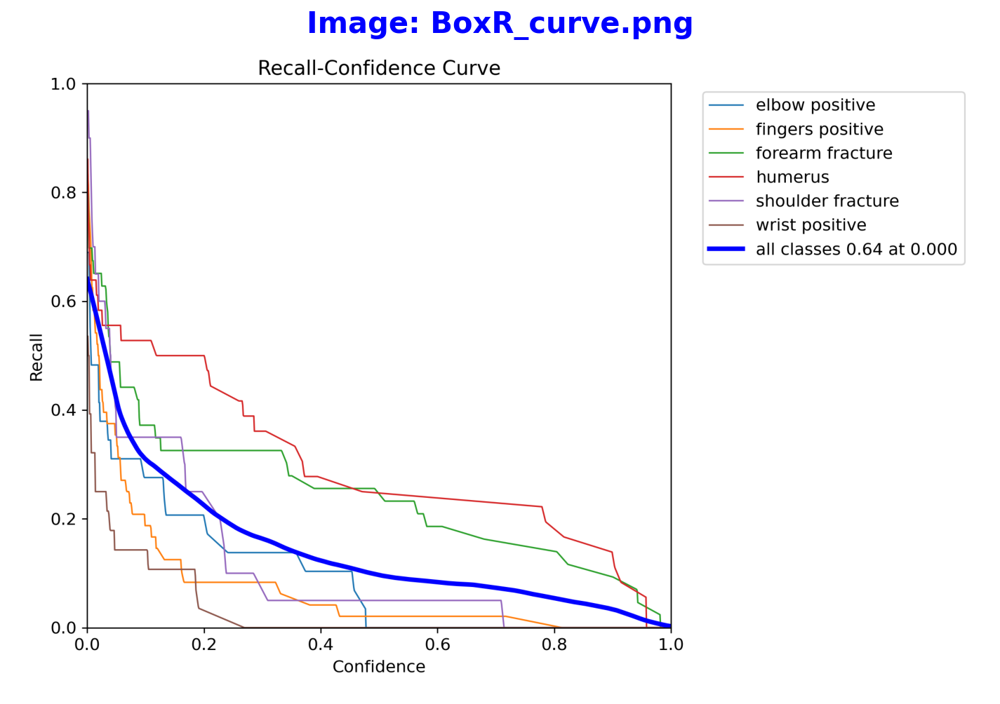

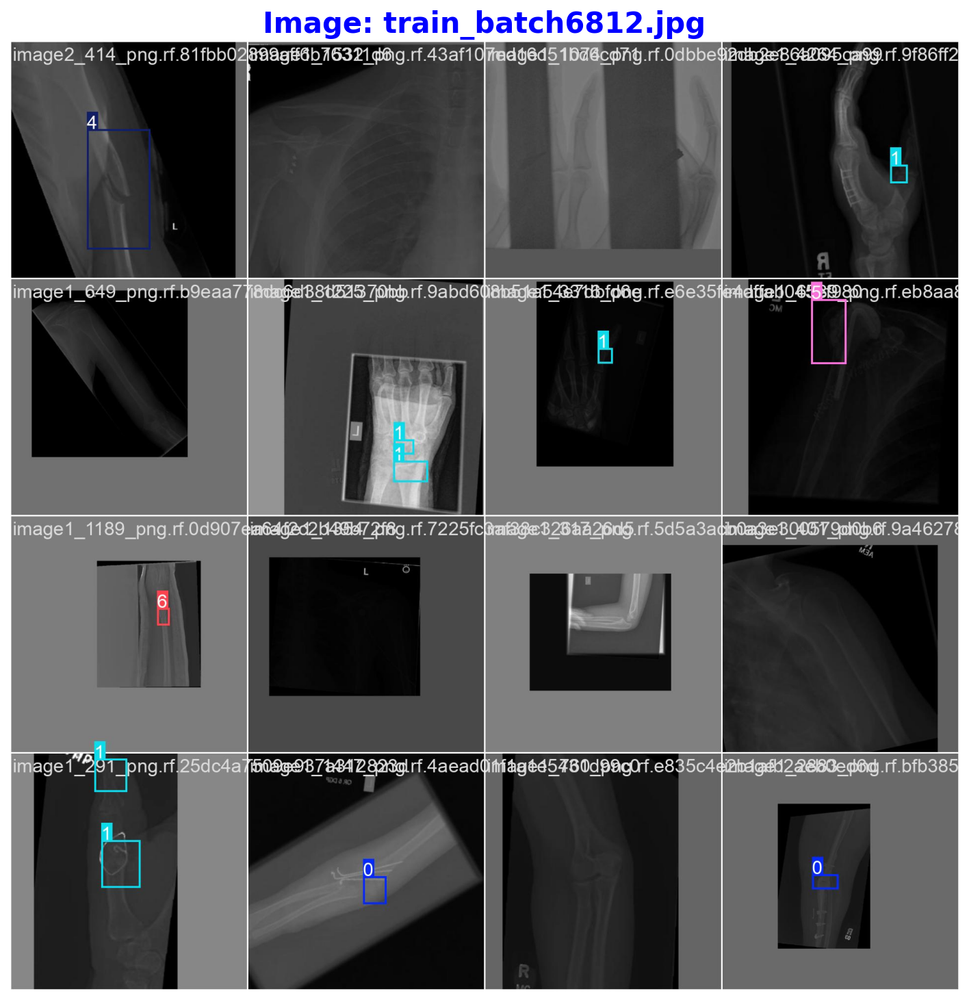

...

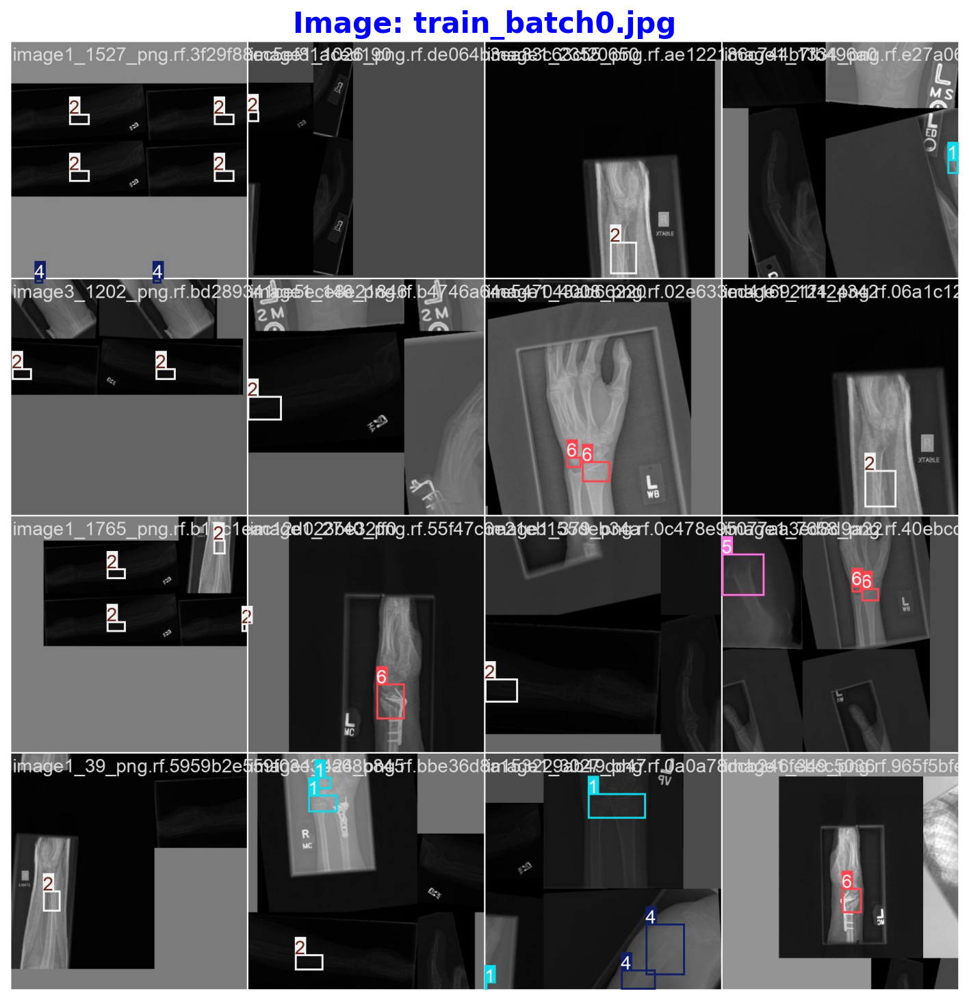

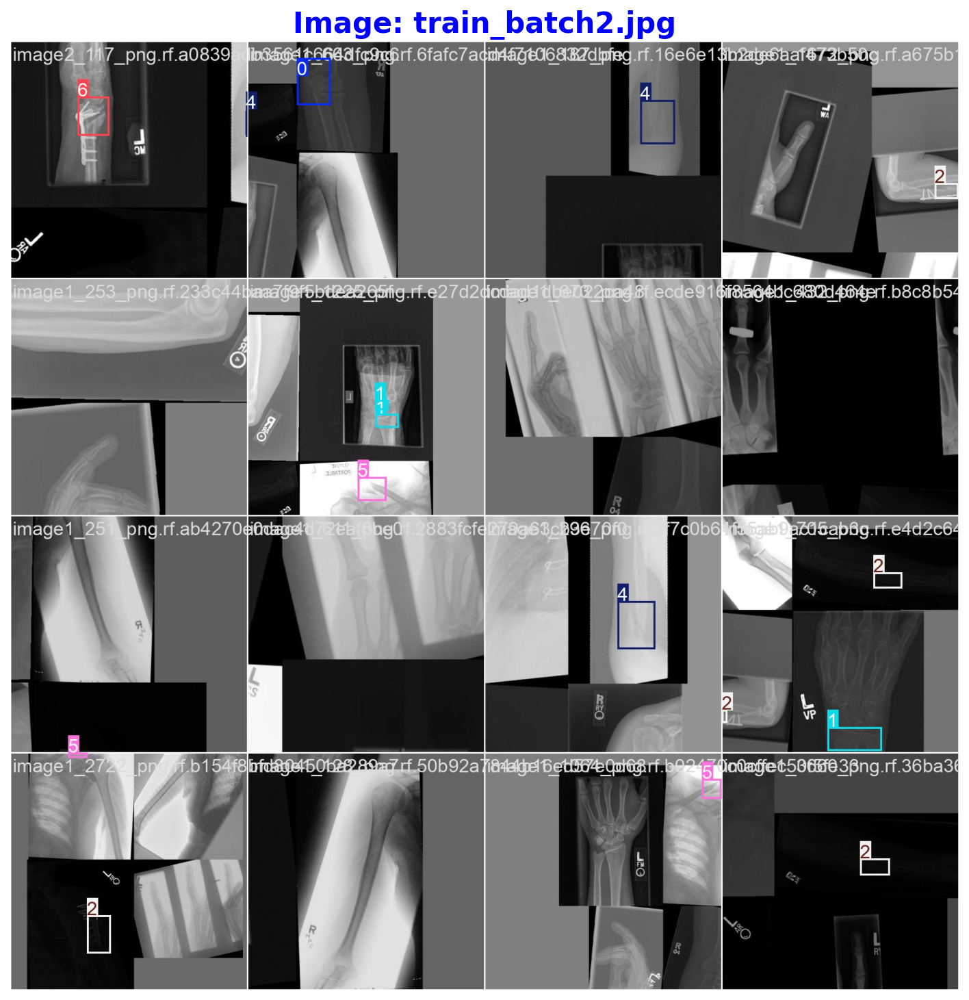

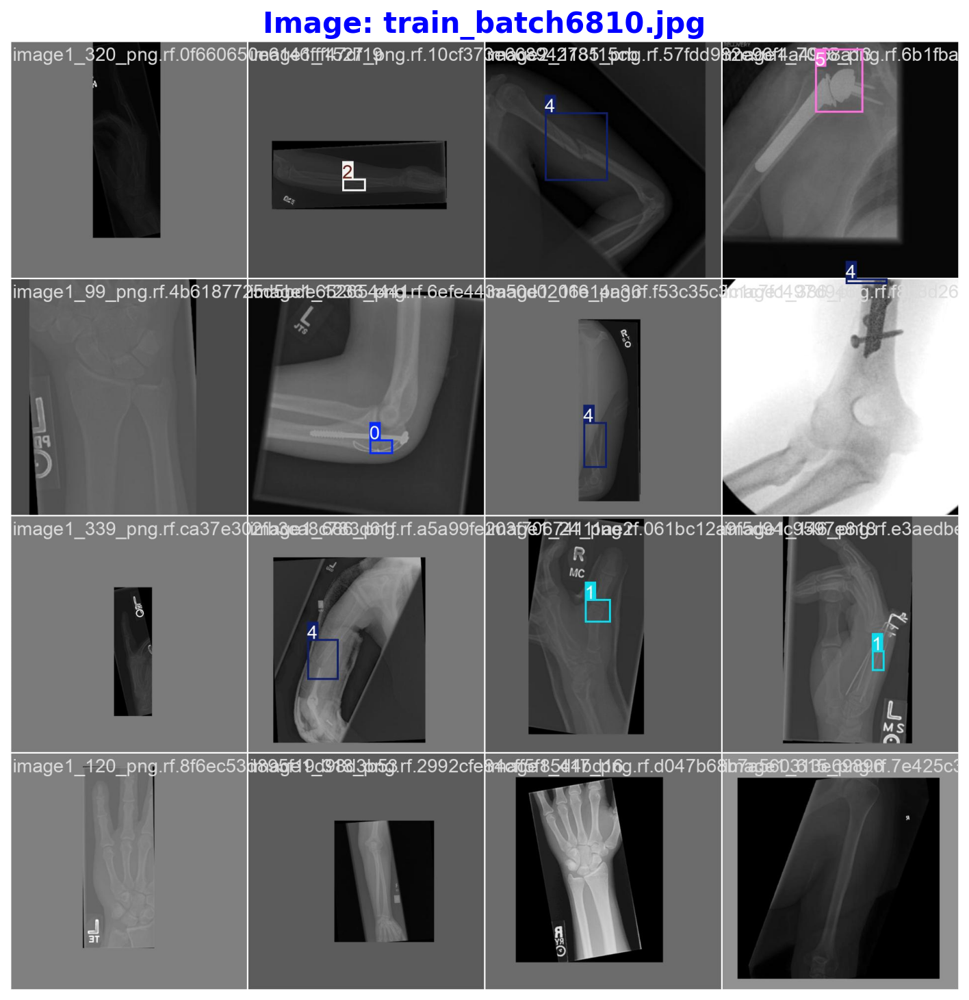

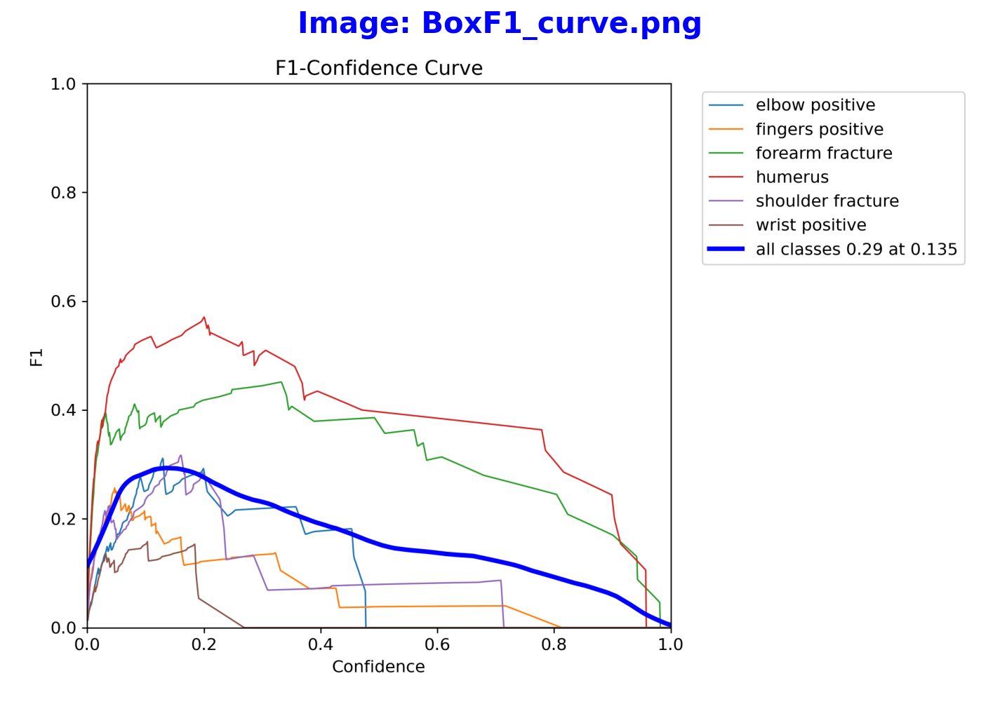

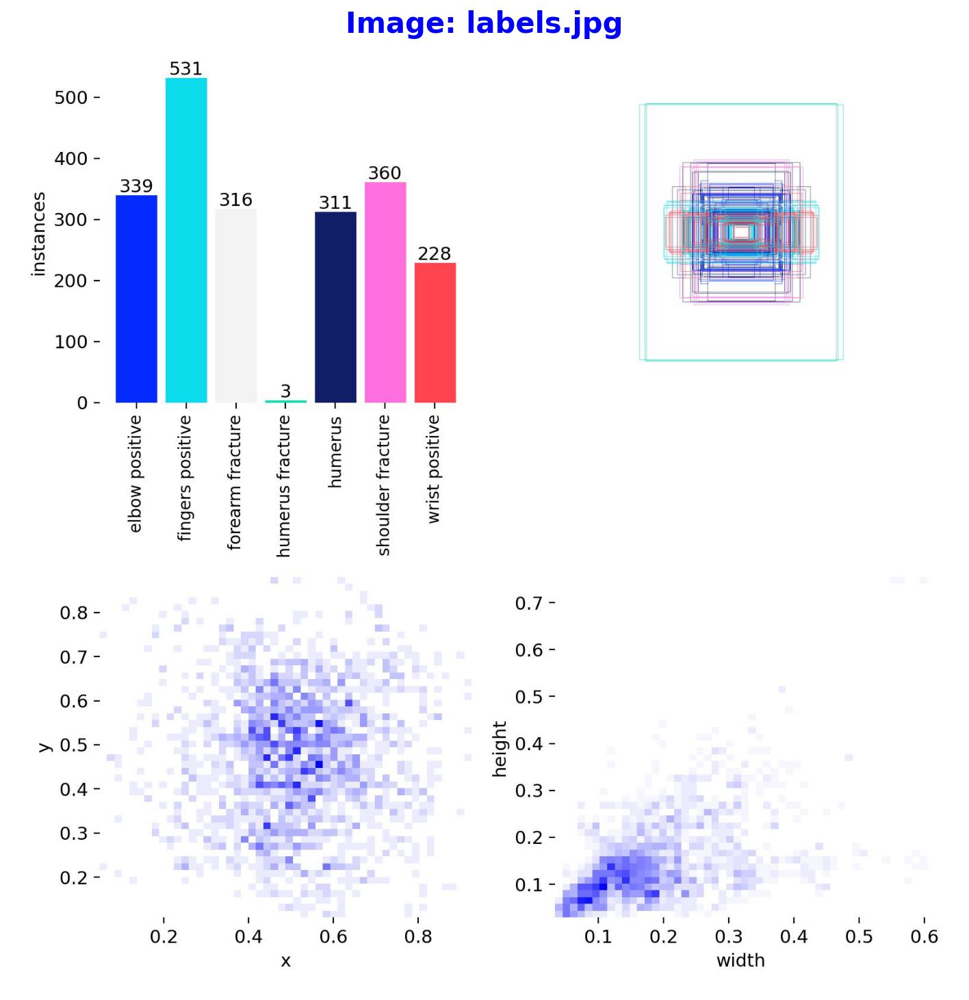

In [17]:
# Define the path to the directory containing the images
image_directory = "/kaggle/working/runs/detect/train"
#image_directory = "/kaggle/working/runs/detect/train"

# Iterate through all image files in the directory
for filename in os.listdir(image_directory):
    if filename.lower().endswith((".jpg",".png")):
        image_path = os.path.join(image_directory, filename)
        image = Image.open(image_path)

        # Display the image
        plt.figure(figsize=(12, 12), dpi=150)
        plt.imshow(image)
        plt.title(f"Image: {filename}", fontsize=20, fontweight='bold', color='blue')  # Customize font properties
        plt.axis("off")  # Hide axes
        plt.show()

In [18]:
Result_Final_model = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
30,31,2060.76,1.99880,2.64490,1.90083,0.30351,0.25491,0.21065,0.07926,2.36044,2.66369,2.16228,0.000258,0.000258,0.000258
31,32,2125.26,1.94116,2.54789,1.86946,0.29164,0.29173,0.23187,0.09035,2.32335,2.67381,2.14665,0.000233,0.000233,0.000233
32,33,2189.53,1.89758,2.47892,1.84498,0.30025,0.29698,0.22972,0.08814,2.33971,2.64538,2.14292,0.000208,0.000208,0.000208
33,34,2253.96,1.90239,2.45303,1.85096,0.26109,0.27385,0.23586,0.08811,2.34279,2.62682,2.16224,0.000183,0.000183,0.000183
34,35,2318.53,1.88964,2.39678,1.83404,0.29292,0.29557,0.23964,0.08871,2.33935,2.64073,2.16022,0.000159,0.000159,0.000159
35,36,2383.02,1.87386,2.38841,1.83571,0.30386,0.30915,0.23677,0.08612,2.36141,2.62561,2.16668,0.000134,0.000134,0.000134
36,37,2447.45,1.86198,2.37261,1.81638,0.32614,0.29699,0.24731,0.09158,2.36489,2.61360,2.16828,0.000109,0.000109,0.000109
37,38,2511.92,1.86379,2.37963,1.80756,0.37037,0.27681,0.25537,0.09179,2.33486,2.62232,2.15324,0.000084,0.000084,0.000084
38,39,2576.40,1.85939,2.33906,1.79942,0.37365,0.27821,0.25681,0.08976,2.34973,2.62689,2.15950,0.000060,0.000060,0.000060
39,40,2640.91,1.84536,2.32533,1.80514,0.33113,0.26910,0.24869,0.09184,2.35610,2.63877,2.15975,0.000035,0.000035,0.000035


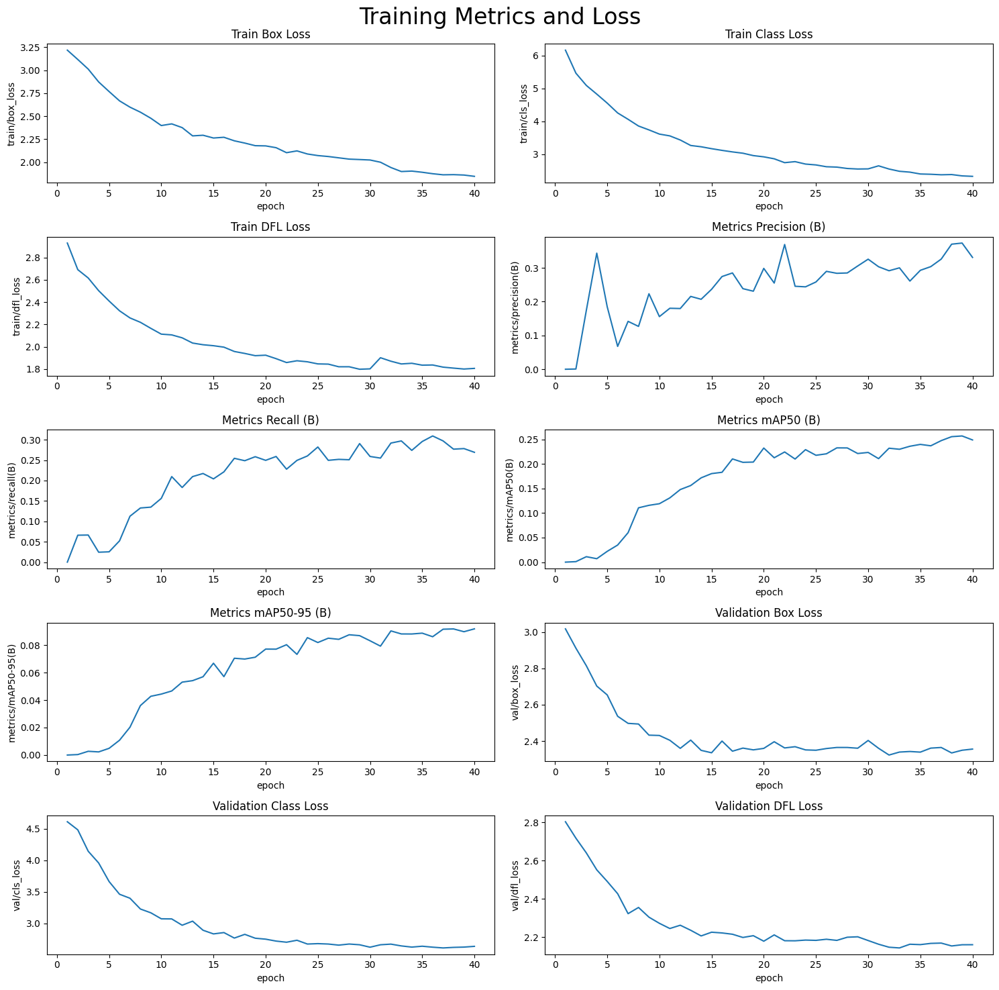

In [19]:
# Read the results.csv file as a pandas dataframe,
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [20]:
# Loading the best performing model
Valid_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.217 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,415,509 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 21.3±14.9 MB/s, size: 13.0 KB)
val: Scanning /kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/valid/labels... 348 images, 175 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 348/348 1.0Kit/s 0.3s<0.0s
WARNING ⚠️ val: Cache directory /kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 22/22 5.1it/s 4.3s0.1s
                   all        348        204      0.302      0.261      0.227     0.0872
        elbow positive         28         29      0.232      0.207      0.183     0.0663
      fingers positive         41         48      0.187      0.104      0.107     0.0327
      forearm fract

# Test the sample image after trained


0: 640x640 (no detections), 15.8ms
Speed: 2.7ms preprocess, 15.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 15.7ms
Speed: 2.2ms preprocess, 15.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 15.7ms
Speed: 1.7ms preprocess, 15.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 15.7ms
Speed: 1.7ms preprocess, 15.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 15.7ms
Speed: 2.7ms preprocess, 15.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 15.7ms
Speed: 1.7ms preprocess, 15.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 15.7ms
Speed: 2.8ms preprocess, 15.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 15.7ms
Speed: 1.7ms preprocess, 15.7ms i

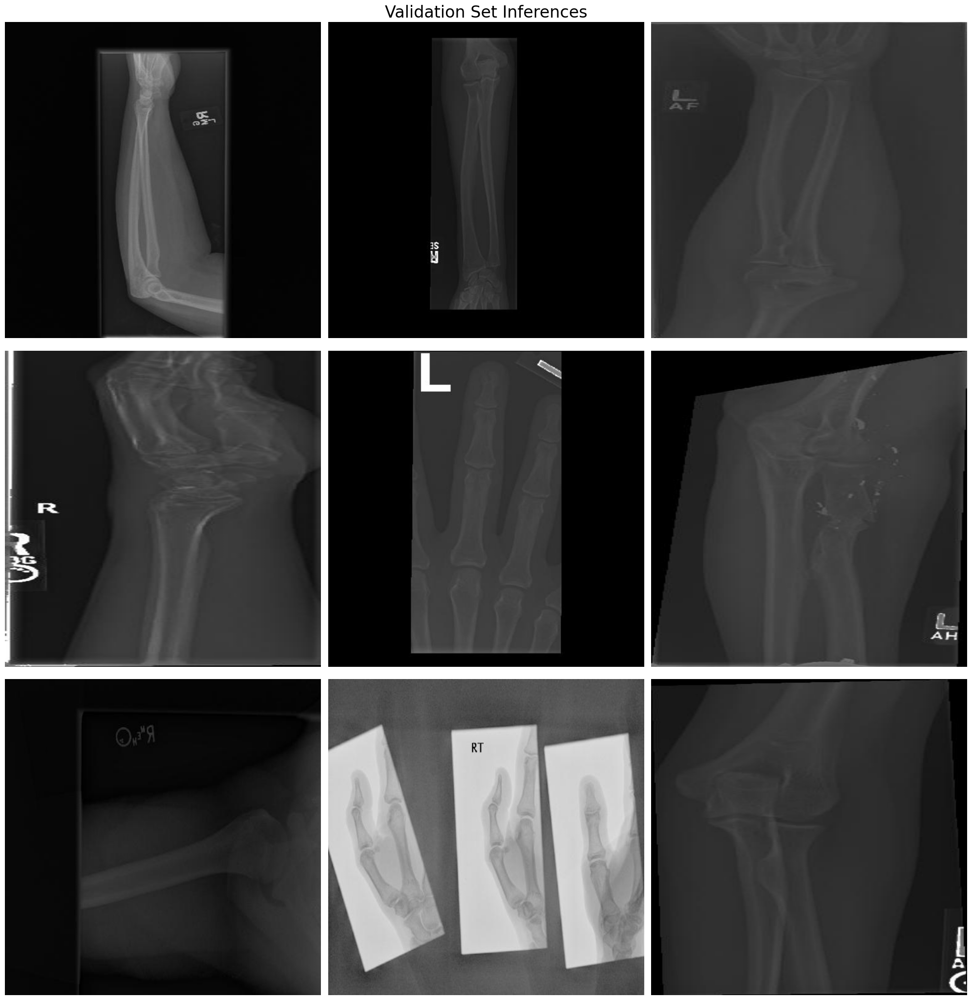

In [22]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640,640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = '/kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640,640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")

        ax.axis('off')

    plt.tight_layout()
    plt.show()